<a href="https://colab.research.google.com/github/yrodriguezmd/IceVision_miniprojects/blob/main/09_BCCD_new_2021_9_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# comiscad
# https://github.com/cosmicad/dataset
## images folder: jpg
## annotations folder: individual xml,  bndbox xmin, ymin, xmax, ymax

# akshaylambda
# https://github.com/akshaylamba/all_CELL_data
## mixed jpg and individual xml, no folder

# revised dataset with better annotation of cell types 

In [ ]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

In [ ]:
from icevision.all import *

In [ ]:
import icevision
print('icevision v',icevision.__version__)
print('torch v',torch.__version__)
print('torchvision v',torchvision.__version__)

icevision v 0.8.1
torch v 1.8.0+cu101
torchvision v 0.9.0+cu101


In [ ]:
## clone akshaylambda all_CELL_data has mis-spelled labels
#!git clone https://github.com/akshaylamba/all_CELL_data.git

# comiscad filename: no '.jpg'
# akshaylambda filename with .jpg

## no csv for exploration

# warning class imbalance, unsure of quality of annotation, better with new version

In [ ]:
%pwd

'/content'

In [ ]:
!git clone https://github.com/Shenggan/BCCD_Dataset.git

In [ ]:
!ls

'=5.1'	 BCCD_Dataset   dataset   install_colab.sh   sample_data


In [ ]:
%cd BCCD_Dataset
!ls

/content/BCCD_Dataset
BCCD	 example.jpg  LICENSE  README.md  test.csv
dataset  export.py    plot.py  scripts


In [ ]:
Path('/content/BCCD_Dataset/BCCD').ls()
# Annotations in xml VOC format

(#3) [Path('/content/BCCD_Dataset/BCCD/Annotations'),Path('/content/BCCD_Dataset/BCCD/JPEGImages'),Path('/content/BCCD_Dataset/BCCD/ImageSets')]

In [ ]:
data_dir = Path('/content/BCCD_Dataset/BCCD')

In [ ]:
images_dir = data_dir/ 'JPEGImages'
annotations_dir = data_dir/'Annotations'

In [ ]:
annotations_dir.ls()


(#364) [Path('/content/BCCD_Dataset/BCCD/Annotations/BloodImage_00269.xml'),Path('/content/BCCD_Dataset/BCCD/Annotations/BloodImage_00086.xml'),Path('/content/BCCD_Dataset/BCCD/Annotations/BloodImage_00407.xml'),Path('/content/BCCD_Dataset/BCCD/Annotations/BloodImage_00265.xml'),Path('/content/BCCD_Dataset/BCCD/Annotations/BloodImage_00326.xml'),Path('/content/BCCD_Dataset/BCCD/Annotations/BloodImage_00207.xml'),Path('/content/BCCD_Dataset/BCCD/Annotations/BloodImage_00381.xml'),Path('/content/BCCD_Dataset/BCCD/Annotations/BloodImage_00033.xml'),Path('/content/BCCD_Dataset/BCCD/Annotations/BloodImage_00274.xml'),Path('/content/BCCD_Dataset/BCCD/Annotations/BloodImage_00070.xml')...]

In [ ]:
# sample configuration as seen by external exploration
# 	<filename>BloodImage_00000.jpg</filename>
# <size>
#		<width>640</width>
#		<height>480</height>
#		<depth>3</depth>
# <object>
#		<name>WBC</name>
#<bndbox>
#			<xmin>260</xmin>
#			<ymin>177</ymin>
#			<xmax>491</xmax>
#			<ymax>376</ymax>

In [ ]:
parsers.VOCBBoxParser

icevision.parsers.voc_parser.VOCBBoxParser

In [ ]:
# VOCBBoxParser
# automatic class_map
parser = parsers.VOCBBoxParser(annotations_dir = annotations_dir,
                     images_dir = images_dir)

train_records, valid_records = parser.parse()

  0%|          | 0/364 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/291 [00:00<?, ?it/s]

AUTOFIX-FAIL - (record_id: 304) - Cannot auto-fix coordinates: <BBox (xmin:181, ymin:329, xmax:181, ymax:329)>
	x_min:181 is greater than or equal to x_max:181
	y_min:329 is greater than or equal to y_max:329 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: 304) Removed annotation with index: 3, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:50
AUTOFIX-FAIL - (record_id: 299) - Cannot auto-fix coordinates: <BBox (xmin:504, ymin:337, xmax:504, ymax:337)>
	x_min:504 is greater than or equal to x_max:504
	y_min:337 is greater than or equal to y_max:337 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: 299) Removed annotation with index: 12, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:50


  0%|          | 0/73 [00:00<?, ?it/s]

In [ ]:
parser.class_map

<ClassMap: {'background': 0, 'WBC': 1, 'RBC': 2, 'Platelets': 3}>

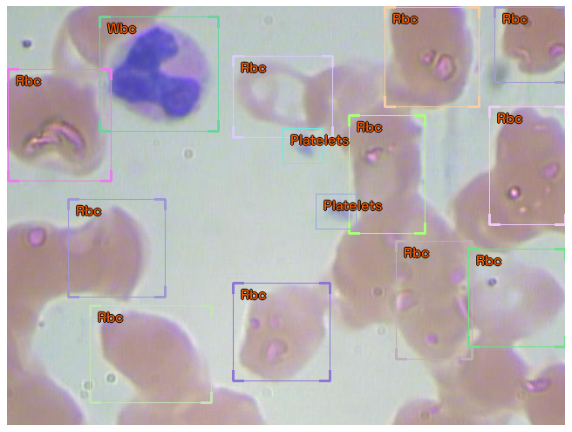

In [ ]:
# no class_map
show_record(train_records[1], 
            figsize = (10,10),font_size=16, label_color = '#ff6000')

In [ ]:
train_records[1]

BaseRecord

common: 
	- Filepath: /content/BCCD_Dataset/BCCD/JPEGImages/BloodImage_00053.jpg
	- Img: None
	- Image size ImgSize(width=640, height=480)
	- Record ID: 50
detection: 
	- BBoxes: [<BBox (xmin:259, ymin:317, xmax:370, ymax:429)>, <BBox (xmin:95, ymin:343, xmax:234, ymax:454)>, <BBox (xmin:259, ymin:57, xmax:373, ymax:150)>, <BBox (xmin:559, ymin:1, xmax:640, ymax:87)>, <BBox (xmin:433, ymin:1, xmax:541, ymax:115)>, <BBox (xmin:553, ymin:115, xmax:640, ymax:250)>, <BBox (xmin:446, ymin:269, xmax:533, ymax:404)>, <BBox (xmin:392, ymin:125, xmax:479, ymax:260)>, <BBox (xmin:1, ymin:72, xmax:119, ymax:200)>, <BBox (xmin:529, ymin:278, xmax:640, ymax:390)>, <BBox (xmin:106, ymin:12, xmax:242, ymax:143)>, <BBox (xmin:316, ymin:140, xmax:362, ymax:180)>, <BBox (xmin:354, ymin:215, xmax:400, ymax:255)>, <BBox (xmin:70, ymin:221, xmax:181, ymax:333)>]
	- Class Map: <ClassMap: {'background': 0, 'WBC': 1, 'RBC': 2, 'Platelets': 3}>
	- Labels: [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 3, 3, 2]

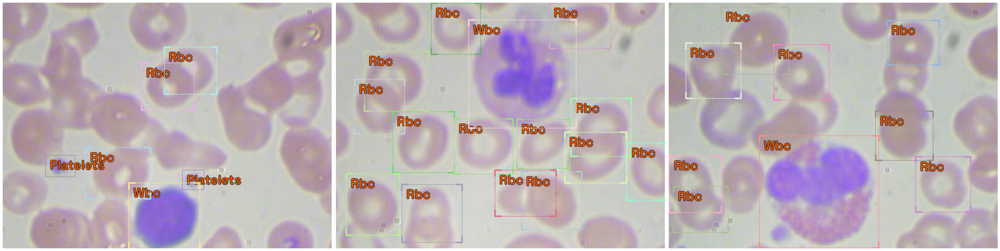

In [ ]:
# no class_map
show_records(train_records[5:8], ncols=3, 
                          font_size=25, label_color = '#ff6000')

In [ ]:
presize = 512
size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size, presize=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=size), tfms.A.Normalize()])

In [ ]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

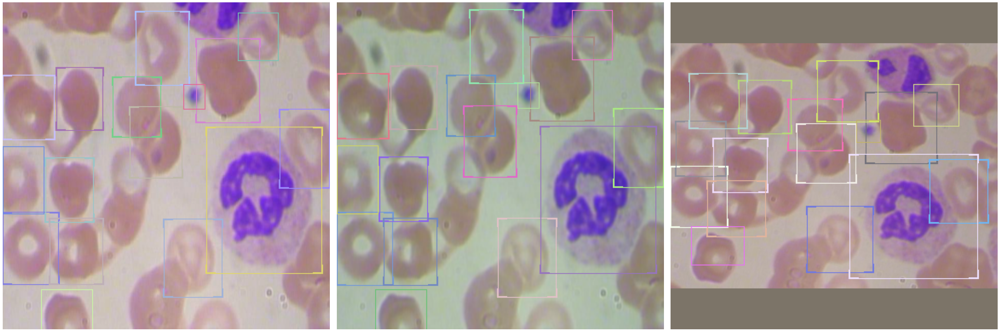

In [ ]:
samples = [train_ds[0] for _ in range(3)]
# no class_map
show_samples(samples, denormalize_fn=denormalize_imagenet, ncols=3,
                                       display_label=False)

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


SuggestedLRs(lr_min=0.0001737800776027143, lr_steep=7.585775892948732e-05)

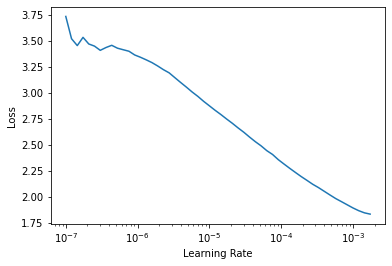

In [ ]:
model_type_frcnn = models.torchvision.faster_rcnn ##
model_frcnn = model_type_frcnn.model( ##
                      num_classes=len(parser.class_map))

train_dl_frcnn = model_type_frcnn.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_frcnn = model_type_frcnn.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)

learn_frcnn = model_type_frcnn.fastai.learner(dls=[train_dl_frcnn, ###
                                                   valid_dl_frcnn], #
                                              model=model_frcnn, metrics=metrics)#
learn_frcnn.lr_find()#

In [ ]:
learn_frcnn.fine_tune(10, 2e-4, freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,2.679191,2.119344,0.184341,00:16


epoch,train_loss,valid_loss,COCOMetric,time
0,1.416206,1.050587,0.318103,00:21
1,1.141289,0.782641,0.404014,00:20
2,0.982270,0.700236,0.510813,00:20
3,0.880493,0.640095,0.517114,00:20
4,0.803492,0.603873,0.542664,00:20
5,0.755640,0.612883,0.550326,00:20
6,0.720667,0.593969,0.537857,00:20
7,0.692422,0.573692,0.566628,00:20
8,0.668631,0.568988,0.569466,00:20
9,0.652222,0.566122,0.573146,00:20


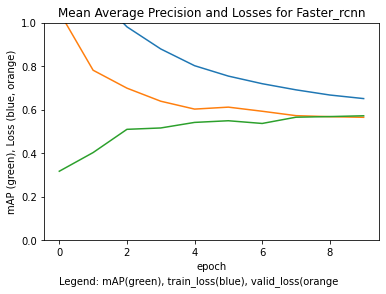

In [ ]:
import matplotlib.pyplot as plt
def plot_metrics(learn, title):
  plt.plot(L(learn.recorder.values).itemgot())#
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(0,-0.2, 'Legend: mAP(green), train_loss(blue), valid_loss(orange')
  plt.ylim(0,1);

plot_metrics(learn_frcnn, 'Mean Average Precision and Losses for Faster_rcnn')

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


SuggestedLRs(lr_min=0.010000000149011612, lr_steep=2.2908675418875646e-06)

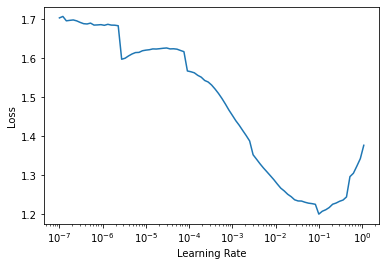

In [ ]:
model_type_yolo = models.ultralytics.yolov5 ##
backbone_yolo = model_type_yolo.backbones.small #
model_yolo = model_type_yolo.model(backbone = backbone_yolo(pretrained=True), ###
                      num_classes=len(parser.class_map),
                      img_size = size)#
train_dl_yolo = model_type_yolo.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_yolo = model_type_yolo.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_yolo = model_type_yolo.fastai.learner(dls=[train_dl_yolo, ###
                                                   valid_dl_yolo], #
                                              model=model_yolo, metrics=metrics)#
learn_yolo.lr_find()#

In [ ]:
learn_yolo.fine_tune(10, 1e-2 , freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,1.325331,1.139470,0.053459,00:09


epoch,train_loss,valid_loss,COCOMetric,time
0,0.924240,1.060495,0.131383,00:09
1,0.811346,1.121675,0.163813,00:09
2,0.743537,1.011921,0.233987,00:09
3,0.700971,1.069148,0.355776,00:09
4,0.668963,0.643757,0.466225,00:09
5,0.638754,0.596046,0.504040,00:09
6,0.615670,0.606651,0.501073,00:09
7,0.595884,0.546406,0.592799,00:09
8,0.577647,0.537022,0.585366,00:09
9,0.566375,0.527781,0.598189,00:08


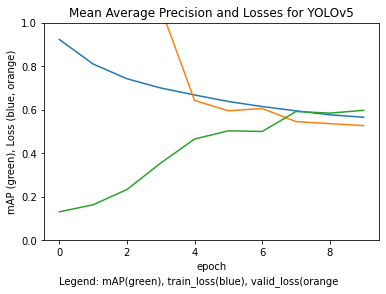

In [ ]:
plot_metrics(learn_yolo, 'Mean Average Precision and Losses for YOLOv5')

/usr/local/lib/python3.7/dist-packages/mmcv/cnn/utils/weight_init.py:119: UserWarning: init_cfg without layer key, if you do not define override key either, this init_cfg will do nothing
  'init_cfg without layer key, if you do not define override'


Use load_from_local loader
The model and loaded state dict do not match exactly

size mismatch for bbox_head.retina_cls.weight: copying a param with shape torch.Size([720, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([27, 256, 3, 3]).
size mismatch for bbox_head.retina_cls.bias: copying a param with shape torch.Size([720]) from checkpoint, the shape in current model is torch.Size([27]).


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


SuggestedLRs(lr_min=8.317637839354575e-05, lr_steep=6.30957365501672e-05)

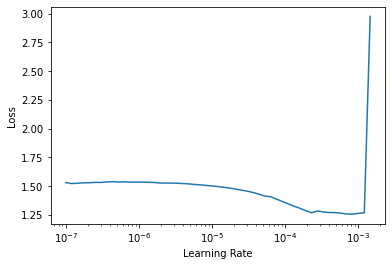

In [ ]:
model_type_ret = models.mmdet.retinanet #
backbone_r50 = model_type_ret.backbones.resnet50_fpn_1x(pretrained=True)#
model_ret = model_type_ret.model(backbone=backbone_r50(pretrained=True), #
                      num_classes=len(parser.class_map))

train_dl_ret = model_type_ret.train_dl(train_ds, batch_size=16, num_workers=4, shuffle=True)#
valid_dl_ret = model_type_ret.valid_dl(valid_ds, batch_size=16, num_workers=4, shuffle=False)#

learn_ret = model_type_ret.fastai.learner(dls=[train_dl_ret, valid_dl_ret], model=model_ret, metrics=metrics)#
learn_ret.lr_find()#

In [ ]:
learn_ret.fine_tune(10, 8e-05 , freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,1.323419,0.758710,0.085663,00:16


epoch,train_loss,valid_loss,COCOMetric,time
0,0.742049,0.632603,0.091033,00:16
1,0.668662,0.525344,0.160934,00:16
2,0.601506,0.450823,0.364362,00:16
3,0.551834,0.406023,0.428022,00:15
4,0.512607,0.399527,0.452407,00:15
5,0.484284,0.381891,0.511267,00:16
6,0.463843,0.378241,0.522751,00:16
7,0.450173,0.375170,0.528630,00:15
8,0.438277,0.375272,0.521397,00:16
9,0.428708,0.373560,0.523579,00:15


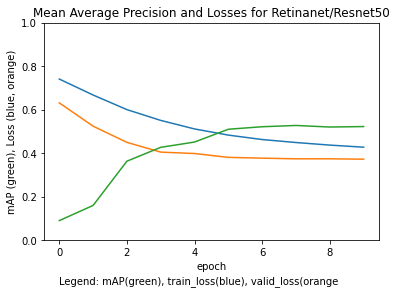

In [ ]:
 plot_metrics(learn_ret, 'Mean Average Precision and Losses for Retinanet/Resnet50')

Downloading: "https://github.com/rwightman/efficientdet-pytorch/releases/download/v0.1/tf_efficientdet_lite0-f5f303a9.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientdet_lite0-f5f303a9.pth
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


SuggestedLRs(lr_min=0.010000000149011612, lr_steep=0.0063095735386013985)

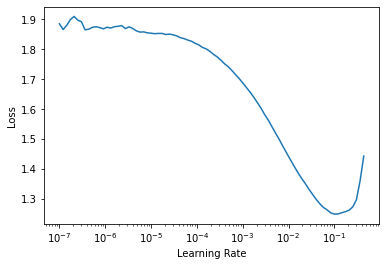

In [ ]:
model_type_eff = models.ross.efficientdet ##
backbone_eff = model_type_eff.backbones.tf_lite0#
model_eff = model_type_eff.model(backbone = backbone_eff(pretrained=True), ##
                      num_classes=len(parser.class_map),
                      img_size = size)#
train_dl_eff = model_type_eff.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_eff = model_type_eff.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_eff = model_type_eff.fastai.learner(dls=[train_dl_eff, ###
                                                   valid_dl_eff], #
                                              model=model_eff, metrics=metrics)#
learn_eff.lr_find()#

In [ ]:
learn_eff.fine_tune(10, 1e-2, freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,1.354106,1.233220,0.061427,00:13


epoch,train_loss,valid_loss,COCOMetric,time
0,0.775341,0.986409,0.133568,00:13
1,0.692639,0.878345,0.088211,00:12
2,0.631162,0.710666,0.263340,00:12
3,0.580275,0.543775,0.352986,00:12
4,0.540835,0.470400,0.391633,00:13
5,0.512829,0.462025,0.432691,00:14
6,0.488335,0.421761,0.443861,00:13
7,0.466705,0.402799,0.464951,00:13
8,0.451592,0.395736,0.479291,00:13
9,0.439908,0.382007,0.494714,00:13


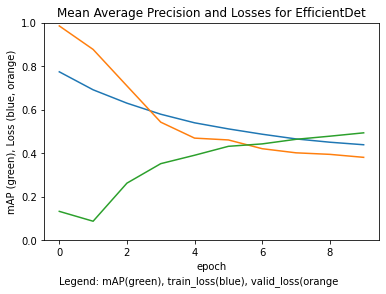

In [ ]:
plot_metrics(learn_eff, 'Mean Average Precision and Losses for EfficientDet')

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


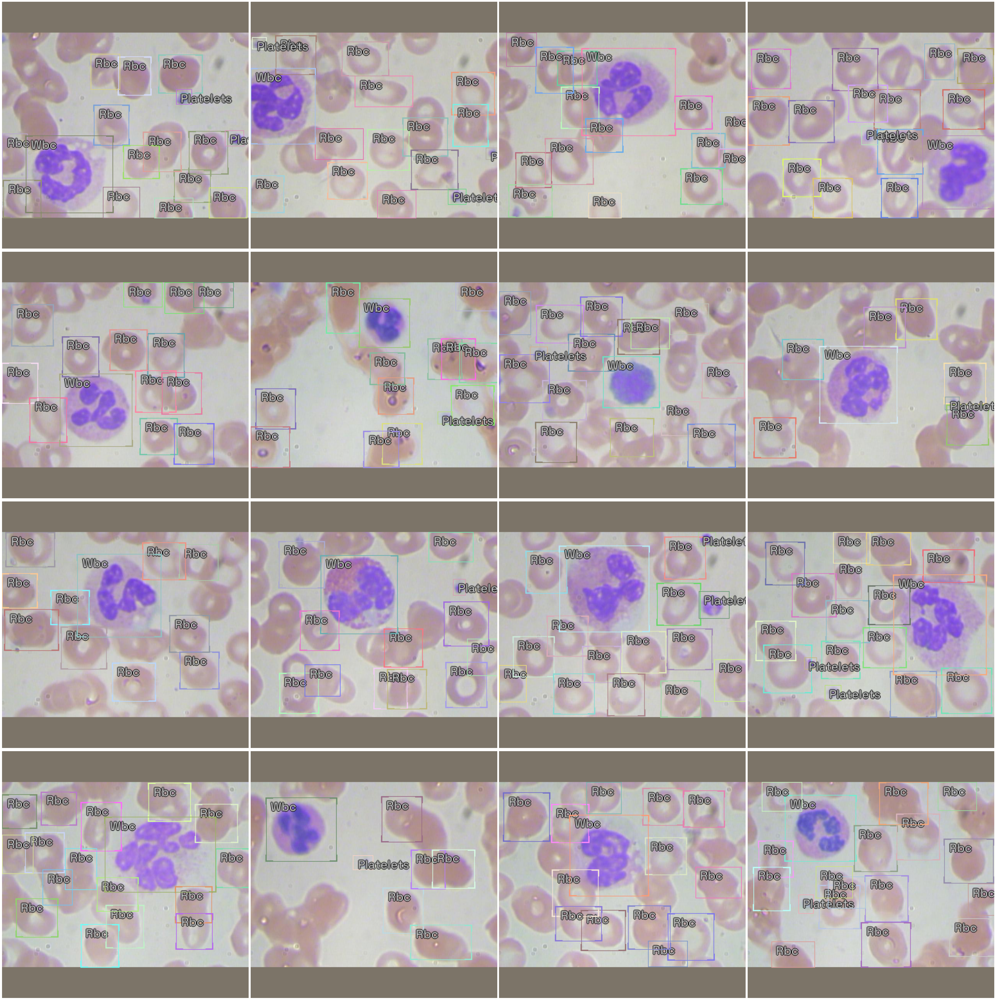

In [ ]:
# final model yolo

model_type = models.ultralytics.yolov5 ##
backbone = model_type.backbones.small #
model = model_type.model(backbone = backbone(pretrained=True), ###
                      num_classes=len(parser.class_map),
                      img_size = size)#
train_dl = model_type.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn = model_type.fastai.learner(dls=[train_dl, ###
                                                   valid_dl], #
                                              model=model, metrics=metrics)#
#learn.lr_find()#

model_type.show_batch(first(valid_dl), ncols=4)

SuggestedLRs(lr_min=0.010000000149011612, lr_steep=2.2908675418875646e-06)

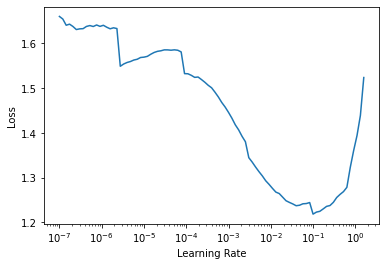

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

learn.lr_find()

In [ ]:
from fastai.callback.tracker import SaveModelCallback
fname='bccd-faster-rcnn-best'
learn.fine_tune(50, 1e-02, freeze_epochs=1, cbs=SaveModelCallback(monitor='COCOMetric', fname=fname))

epoch,train_loss,valid_loss,COCOMetric,time
0,1.299190,1.137334,0.035769,00:08


Better model found at epoch 0 with COCOMetric value: 0.03576904103801467.


epoch,train_loss,valid_loss,COCOMetric,time
0,0.940015,0.946171,0.124162,00:08
1,0.849269,0.864285,0.191624,00:08
2,0.778614,0.800524,0.266775,00:09
3,0.726486,0.717151,0.348577,00:08
4,0.693285,0.675834,0.418770,00:08
5,0.664725,0.647333,0.443342,00:09
6,0.648871,0.580734,0.498173,00:09
7,0.627831,0.612249,0.492343,00:08
8,0.615377,0.580178,0.487439,00:08
9,0.605098,0.596607,0.486740,00:08


Better model found at epoch 0 with COCOMetric value: 0.12416197775963986.
Better model found at epoch 1 with COCOMetric value: 0.19162426937262642.
Better model found at epoch 2 with COCOMetric value: 0.2667746469992304.
Better model found at epoch 3 with COCOMetric value: 0.34857671747031765.
Better model found at epoch 4 with COCOMetric value: 0.41876958893134936.
Better model found at epoch 5 with COCOMetric value: 0.4433423245288612.
Better model found at epoch 6 with COCOMetric value: 0.498173121533314.
Better model found at epoch 10 with COCOMetric value: 0.5425613582434927.
Better model found at epoch 13 with COCOMetric value: 0.5657354061178219.
Better model found at epoch 14 with COCOMetric value: 0.5667101240680709.
Better model found at epoch 18 with COCOMetric value: 0.5776652479522455.
Better model found at epoch 20 with COCOMetric value: 0.6223445121235931.
Better model found at epoch 42 with COCOMetric value: 0.6269089982988771.
Better model found at epoch 46 with COCOMe

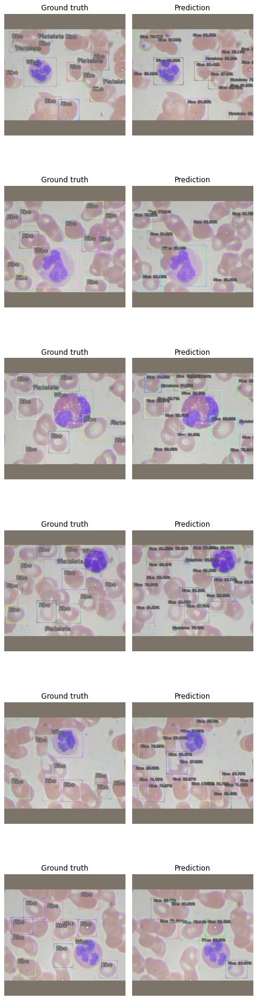

In [ ]:
model_type.show_results(model, valid_ds) # class_map rem

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = Path('/content/gdrive/My Drive/')

Mounted at /content/gdrive


In [ ]:
# save last model
torch.save(model.state_dict(), root_dir/'models/bccd-faster-rcnn.pth')

In [ ]:
# best model
!ls models

bccd-faster-rcnn-best.pth


In [ ]:
!cp models/bccd-faster-rcnn-best.pth /content/gdrive/"My Drive"/models/bccd-faster-rcnn-best.pth